# Notebook for GoogleMultiModalFlow Application for Crop Image Labeling

In this example, we will show you how to use MultiModal as a classifier using Google's models via uniflow.

### Before running the code

You will need to `uniflow` conda environment to run this notebook. You can set up the environment following the instruction:
```
conda create -n uniflow python=3.10 -y
conda activate uniflow  # some OS requires `source activate uniflow`
```

To obtain a JSON file for Google Cloud Platform (GCP) credentials and set it as an environment variable for use in a project (like accessing services from a Jupyter notebook), follow these simplified steps:

Step 1: Create a GCP Project
Log into the Google Cloud Console: Navigate to the Google Cloud Console and log in with your Google account.
Create a new project: Click on the project dropdown at the top of the dashboard, then click "New Project". Follow the prompts to create your new project.

Step 2: Enable APIs
Navigate to the API Library: With your project selected, navigate to the "API & Services" > "Library" in the side menu.
Enable required APIs: Search for and enable the APIs required for your project, such as the Cloud Vision API, Cloud Storage, etc.

Step 3: Create Service Account and Download JSON Key
Create a service account:
Go to "IAM & Admin" > "Service accounts" from the side menu.
Click "Create Service Account", enter a name and description, and click "Create".
Grant the necessary roles to your service account (e.g., "Owner", "Editor", or a more specific role depending on your needs). Click "Continue" and then "Done" after setting roles.
Generate JSON key:
Find your new service account in the list and click on it.
Go to the "Keys" tab, click "Add Key", and choose "Create new key".
Select "JSON" as the key type and click "Create". The JSON key file will be downloaded to your computer.

Step 4: Set Environment Variable in Your Project
Transfer the JSON key to your server or development environment where your Jupyter notebook is running. 

E.g. Here is an example, rename your json file as 'googleapi.json'


In [1]:
import os

# Set the environment variable within the notebook session
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "../../googleapi.json"

In [2]:
!pip install google-generativeai

### Update system path

In [3]:
%reload_ext autoreload
%autoreload 2

import sys

sys.path.append(".")
sys.path.append("..")
sys.path.append("../..")

## Import dependency

In [4]:
import pprint
from PIL import Image
from IPython.display import display

from uniflow import PromptTemplate
from uniflow.flow.client import TransformClient
from uniflow.flow.flow_factory import FlowFactory
from uniflow.flow.config  import TransformConfig
from uniflow.op.model.model_config  import GoogleMultiModalModelConfig
from uniflow.viz import Viz
from uniflow.op.prompt import Context


/opt/conda/envs/uniflow1/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Display the different flows

In [5]:
FlowFactory.list()

{'extract': ['ExtractHTMLFlow',
  'ExtractImageFlow',
  'ExtractIpynbFlow',
  'ExtractMarkdownFlow',
  'ExtractPDFFlow',
  'ExtractTxtFlow'],
 'transform': ['TransformAzureOpenAIFlow',
  'TransformCopyFlow',
  'TransformGoogleFlow',
  'TransformGoogleMultiModalModelFlow',
  'TransformHuggingFaceFlow',
  'TransformLMQGFlow',
  'TransformOpenAIFlow'],
 'rater': ['RaterFlow']}

### Prepare Prompts
Here, we will load all images that needs to be classified.

In [6]:
image_dir = './data/sample_crop_images'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

In [7]:
input_images = [Image.open(os.path.join(image_dir, filename)) for filename in image_files]
data = [Context(context=image) for image in input_images]

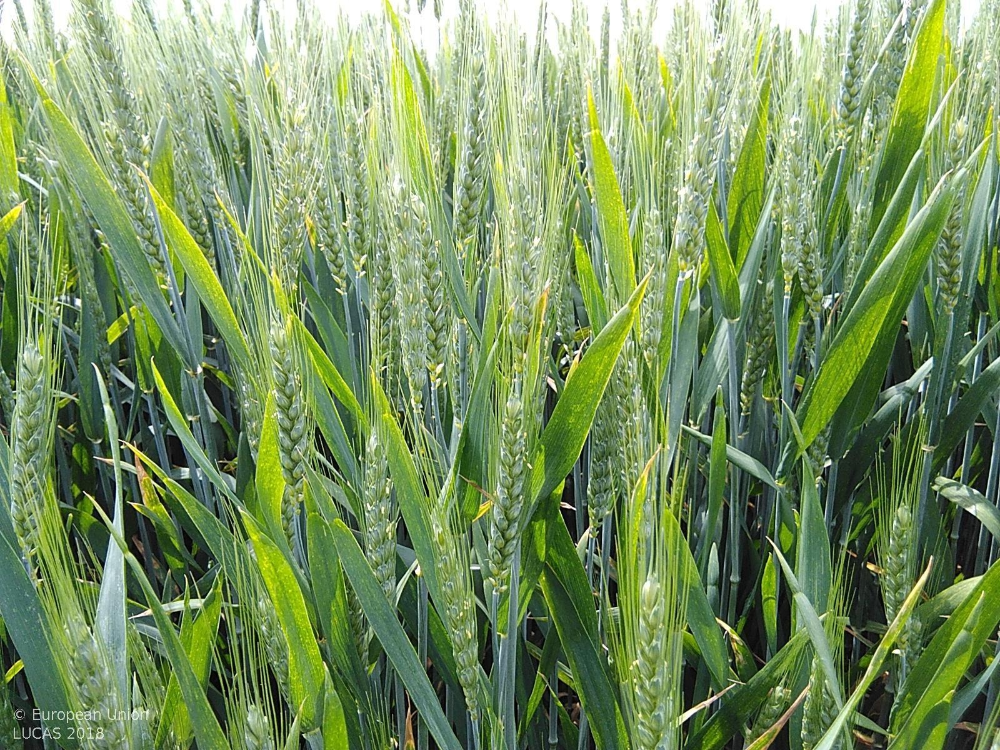

In [8]:
input_images[3]

Next, for the given raw text strings `raw_context_input` above, we convert them to the `Context` class to be processed by `uniflow`.

### Use LLM to generate data
In this example, we use the base `Config` defaults with the GoogleModelConfig to generate questions and answers.

In [9]:
config = TransformConfig(
    flow_name="TransformGoogleMultiModalModelFlow",
    model_config=GoogleMultiModalModelConfig(),
    prompt_template=PromptTemplate( 
        instruction="""You are a multimodal AI model designed to classify wheat images based on their content.
        Your specific task is to classify the image of wheat into one of the following categories:
        Actively Growing Wheat (AGW): Select this category for images depicting green wheat in the early stages of growth, indicating active cultivation.
        Ready to Harvest (RTH): Use this category for images where the wheat appears yellow, indicating it is mature and ready for harvest.
        Wheat Field Residue (WFR): This category is for images showing fields after wheat has been harvested, with only crop residues remaining.
        Others: Select this category if one or few wheat ear are detached from plants and lying on a surface, or it is a something places on a background that is not a crop field.
        Your output should be in format. Explain: ... Answer: One of (AGW, RTH, WFR, Others)""",
        ),
)
client = TransformClient(config)

Now we call the `run` method on the `client` object to execute the question-answer generation operation on the data shown above.

In [10]:
output = client.run(data)


  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:45<00:00,  4.56s/it]


### View the output

Let's take a look of the generated output.

In [11]:
pprint.pprint(output)

[{'output': [{'error': 'No errors.',
              'response': [' Explain: The image shows a close-up of a wheat '
                           'field after harvest, with the wheat straw left on '
                           'the ground.\n'
                           'Answer: WFR']}],
  'root': <uniflow.node.Node object at 0x7f5ca3e82440>},
 {'output': [{'error': 'No errors.',
              'response': [' Explain: The image shows a field of wheat that '
                           'has been harvested, with only the stalks '
                           'remaining.\n'
                           'Answer: WFR']}],
  'root': <uniflow.node.Node object at 0x7f5cb8bac700>},
 {'output': [{'error': 'No errors.',
              'response': [' Explain: The image shows a field with harvested '
                           'wheat. The wheat is dry and yellow, and there are '
                           'no green plants visible.\n'
                           'Answer: WFR']}],
  'root': <uniflow.node.Node obje

In [12]:
len(output)

10

In [13]:
import pandas as pd

labels = ["AGW", "RTH", "WFR", "Others"]  
error_count = 0
data = [] 

for index, item in enumerate(output):
    image_file = image_files[index]  
    
    try:
        response = item['output'][0]['response'][0]  # Attempting to extract the response text
    except KeyError:
        response = "Others"  
        classification = "Others"  
        error_count += 1
    else:
        # Determine classification based on the presence of keywords
        if "RTH" in response:
            classification = "RTH"
        elif "WFR" in response:
            classification = "WFR"
        elif "AGW" in response:
            classification = "AGW"
        elif "Others" in response:
            classification = "Others"
        else:
            classification = "Others"  
    data.append({'ImageFile': image_file, 'Response': response, 'Classification': classification})

df_results = pd.DataFrame(data, columns=['ImageFile', 'Response', 'Classification'])


Show error counts

In [14]:
error_count

0

Classification Results

In [15]:
df_results

,ImageFile,Response,Classification
0,22890_wheat_yes.jpg,Explain: The image shows a close-up of a whea...,WFR
1,28763_wheat_yes.jpg,Explain: The image shows a field of wheat tha...,WFR
2,16830_wheat_yes.jpg,Explain: The image shows a field with harvest...,WFR
3,16589_wheat_no.jpg,Explain: The image shows a field of green whe...,AGW
4,73676_wheat_no.jpg,Explain: The image shows a field of wheat tha...,RTH
5,54287_wheat_yes.jpg,Explain: The image shows a close-up of a whea...,AGW
6,41727_wheat_yes.jpg,Explain: The image shows a field with harvest...,WFR
7,22957_wheat_no.jpg,Explain: The image shows a close-up of a whea...,RTH
8,54438_wheat_yes.jpg,Explain: The image shows a field of wheat tha...,WFR
9,41595_wheat_yes.jpg,Explain: The image shows a single wheat ear o...,RTH


Classfication Result Label Count

In [16]:
labels = ["AGW", "RTH", "WFR", "Others"] 

results = {}
for label in labels:
    count = 0
    for o in output:
        try:
            response = o['output'][0]['response'][0]
        except KeyError:
            continue  # Skip this iteration if there's a KeyError
        if label in response:
            count += 1
    results[label] = count

results


{'AGW': 2, 'RTH': 3, 'WFR': 5, 'Others': 0}

Let's take one image and see the classification result

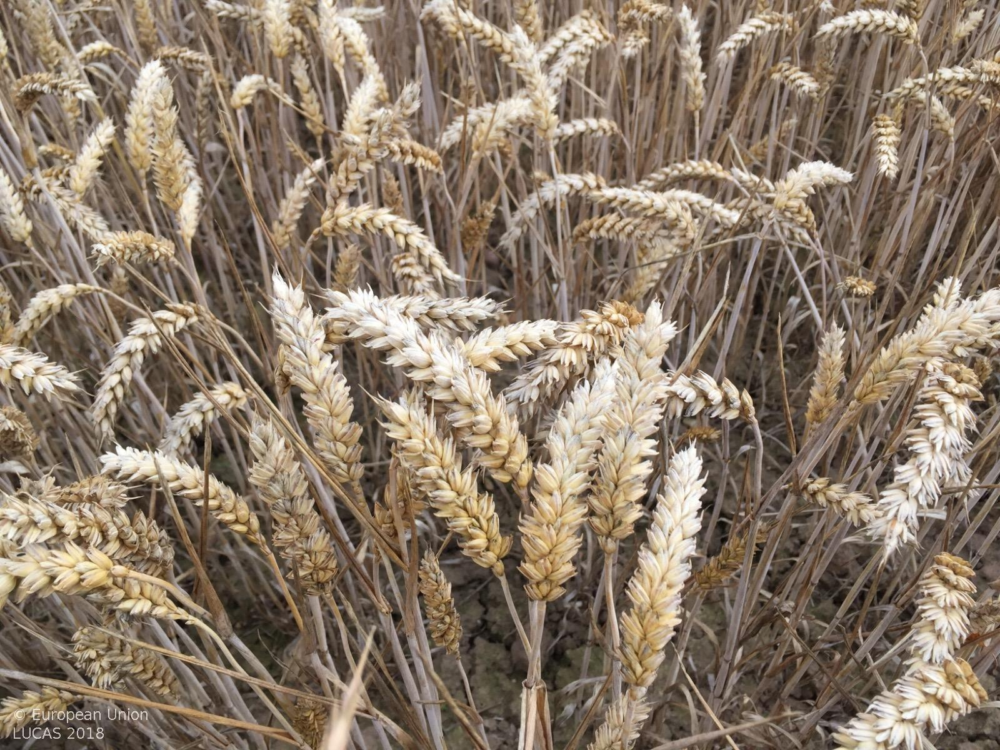

In [17]:
input_images[7]

In [18]:
df_results.iloc[7]['Response']

' Explain: The image shows a close-up of a wheat field. The wheat is ripe and ready to be harvested.\nAnswer: RTH'

Move the image to different folders for future training use if necessary

In [19]:
import pandas as pd
import os
import shutil

# Directory containing the images
image_dir = ''

# Destination root directory where subdirectories will be created
dest_root_dir = ''

for index, row in df_results.iterrows():
    # Source path of the current image
    src_path = os.path.join(image_dir, row['ImageFile'])
    
    # Destination directory based on classification
    dest_dir = os.path.join(dest_root_dir, row['Classification'])
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)
    # Destination path for the current image
    dest_path = os.path.join(dest_dir, row['ImageFile'])
    
    # Copy the image from source to destination
    shutil.move(src_path, dest_path)

print("Images have been classified and moved.")

## End of the notebook

Check more Uniflow use cases in the [example folder](https://github.com/CambioML/uniflow/tree/main/example)!

<a href="https://www.cambioml.com/" title="Title">
    <img src="../image/cambioml_logo_large.png" style="height: 100px; display: block; margin-left: auto; margin-right: auto;"/>
</a>